# Plots about Pressure

I this notebook, we look for the behavior of pressure in the machine data. We are looking specifically for 
things that cause Hochland trouble, namely:
- High pressure
- Large rises and drops in pressure

A things we will not do here is crosscheck with the Rawdata of the receipt we have. 

# Spark starten

In [1]:
import pyspark
import os
myAppName = "plot-high-pressure" #Nur kleine Buchstaben hier, at any cost
spark = pyspark.sql.SparkSession\
       .builder\
       .appName(myAppName)\
       .config("spark.kubernetes.executor.podNamePrefix", os.environ["POD_NAME"]+'-'+myAppName)\
       .config("spark.executor.cores", "2")\
       .config("spark.executor.memory", "4g")\
       .config("spark.driver.maxResultSize", "4g")\
       .config("spark.driver.memory", "4g")\
       .config("spark.executor.instances", "8")\
       .config("spark.jars.packages", "")\
       .getOrCreate()

Py4JJavaError: An error occurred while calling None.org.apache.spark.api.java.JavaSparkContext.
: org.apache.spark.SparkException: External scheduler cannot be instantiated
	at org.apache.spark.SparkContext$.org$apache$spark$SparkContext$$createTaskScheduler(SparkContext.scala:2934)
	at org.apache.spark.SparkContext.<init>(SparkContext.scala:528)
	at org.apache.spark.api.java.JavaSparkContext.<init>(JavaSparkContext.scala:58)
	at java.base/jdk.internal.reflect.NativeConstructorAccessorImpl.newInstance0(Native Method)
	at java.base/jdk.internal.reflect.NativeConstructorAccessorImpl.newInstance(NativeConstructorAccessorImpl.java:62)
	at java.base/jdk.internal.reflect.DelegatingConstructorAccessorImpl.newInstance(DelegatingConstructorAccessorImpl.java:45)
	at java.base/java.lang.reflect.Constructor.newInstance(Constructor.java:490)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:247)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:238)
	at py4j.commands.ConstructorCommand.invokeConstructor(ConstructorCommand.java:80)
	at py4j.commands.ConstructorCommand.execute(ConstructorCommand.java:69)
	at py4j.GatewayConnection.run(GatewayConnection.java:238)
	at java.base/java.lang.Thread.run(Thread.java:834)
Caused by: java.lang.IllegalArgumentException: requirement failed: initial executor number 8 must between min executor number 0 and max executor number 2
	at scala.Predef$.require(Predef.scala:281)
	at org.apache.spark.scheduler.cluster.SchedulerBackendUtils$.getInitialTargetExecutorNumber(SchedulerBackendUtils.scala:39)
	at org.apache.spark.scheduler.cluster.k8s.KubernetesClusterSchedulerBackend.<init>(KubernetesClusterSchedulerBackend.scala:54)
	at org.apache.spark.scheduler.cluster.k8s.KubernetesClusterManager.createSchedulerBackend(KubernetesClusterManager.scala:133)
	at org.apache.spark.SparkContext$.org$apache$spark$SparkContext$$createTaskScheduler(SparkContext.scala:2928)
	... 13 more


Please use the following line after stoping to use the notebook

In [27]:
#spark.stop()

_________________

# Imports

In [ ]:
import pyspark.sql.functions as F
from pyspark.sql.types import *
from pyspark.sql import Window

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import matplotlib.backends.backend_pdf
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

__________________

# High Pressure 
We set a threshold for the pressure and then plot all days in the Machine data

In [14]:
#Here one can customize

threshold = 15 #Threshhold we care about in bar
machines_of_interest = ["300", "301", "302", "303"] #The machines one wished to be considered
pdf_name = "Druck_ueber_15_bar" #If you want to write a pdf, pick a name here and comment in all things pdf in the next cell

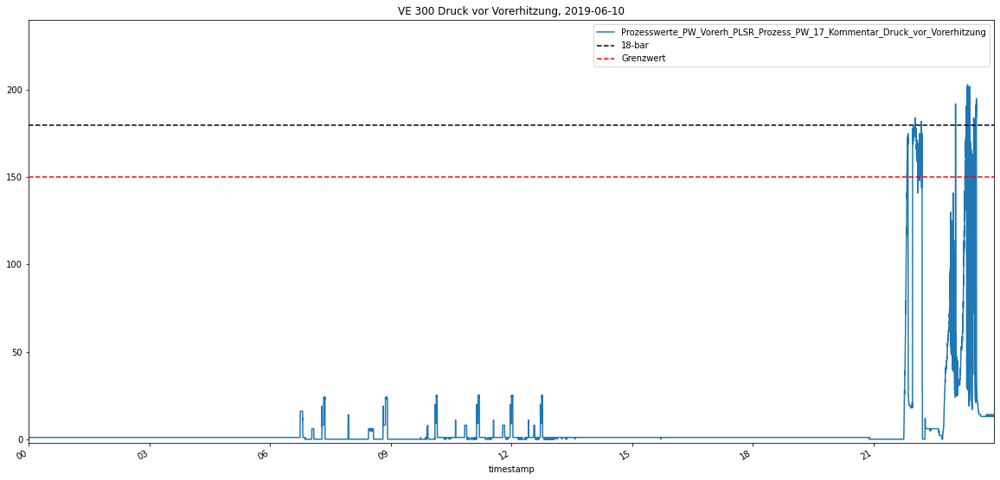

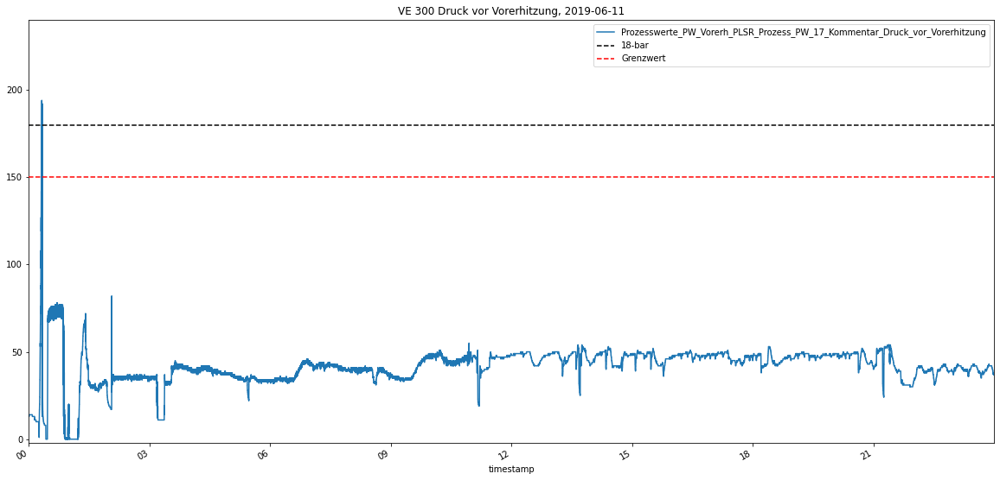

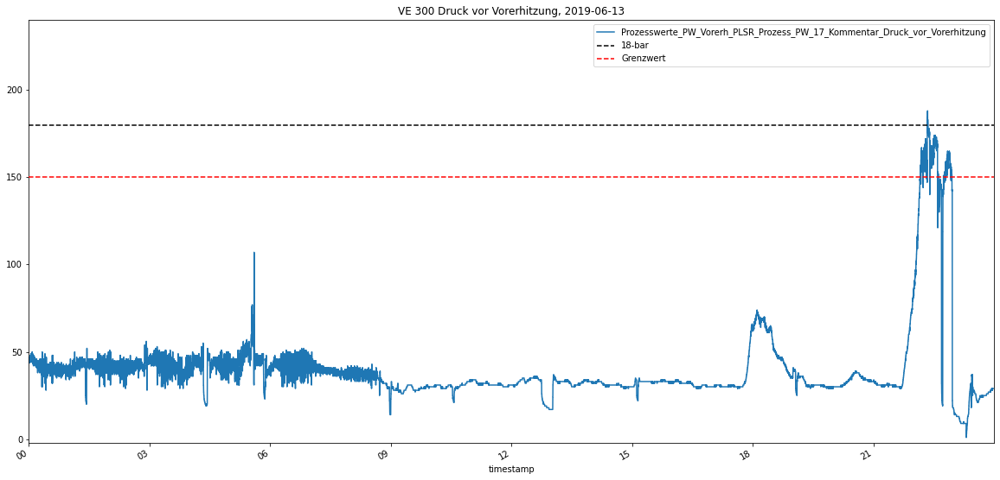

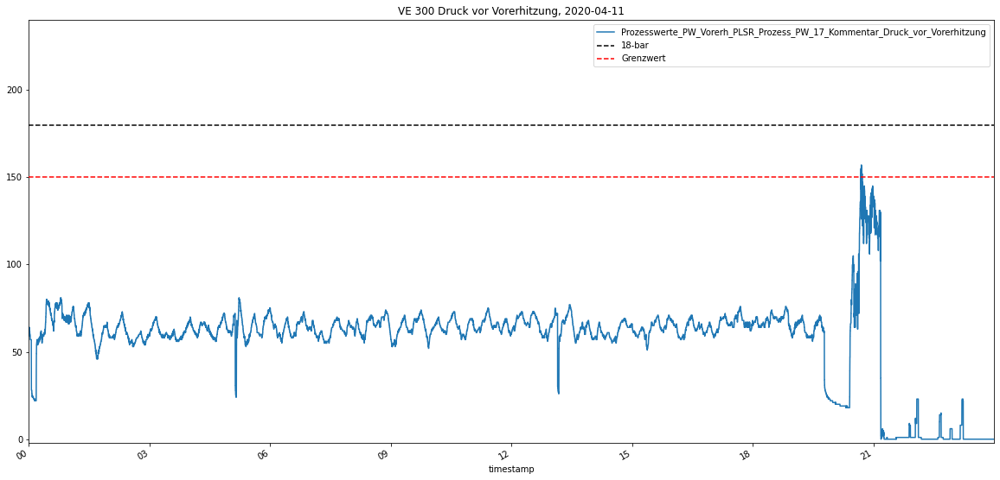

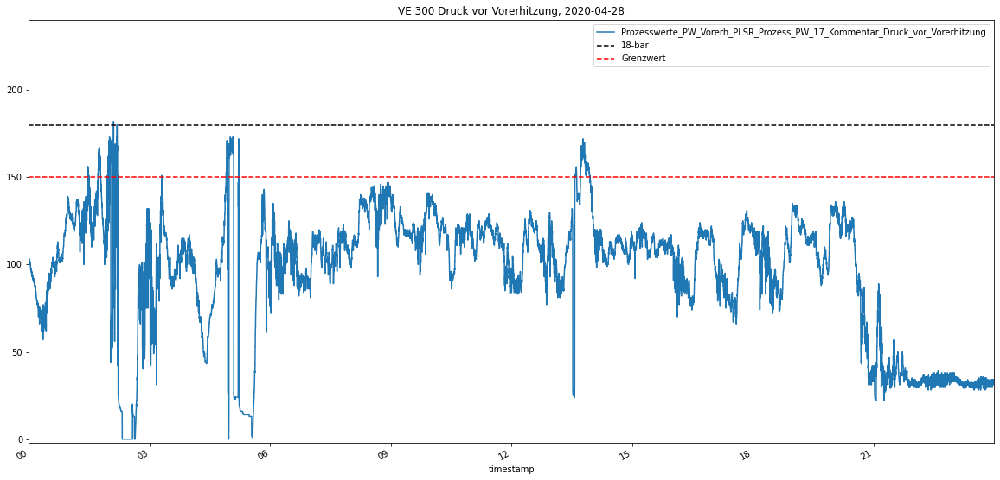

...

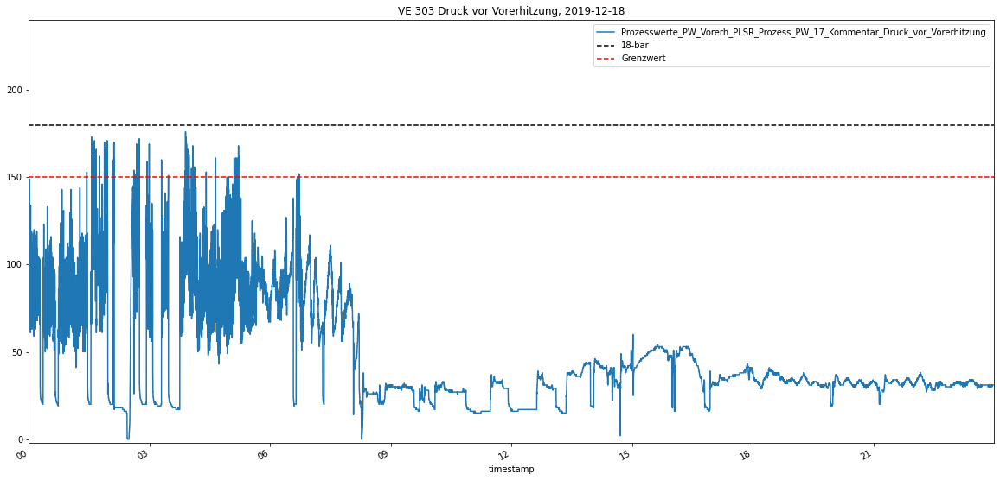

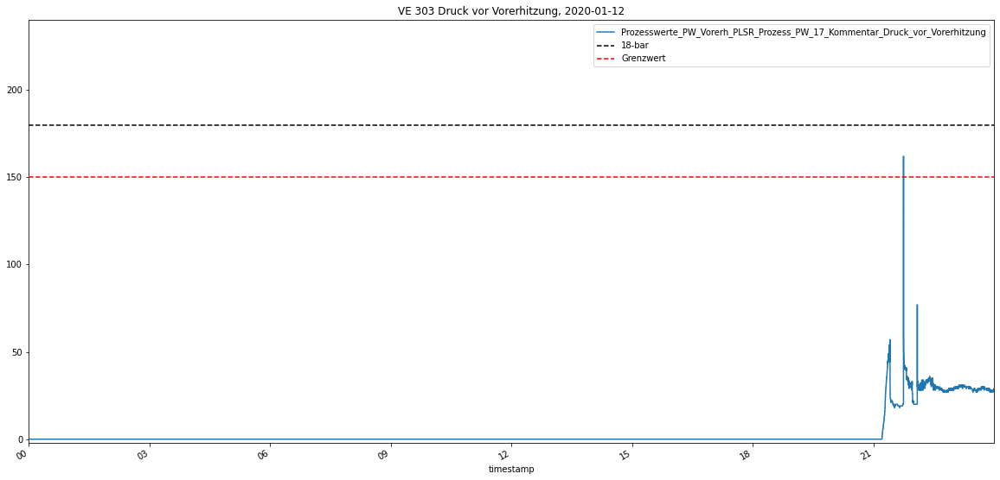

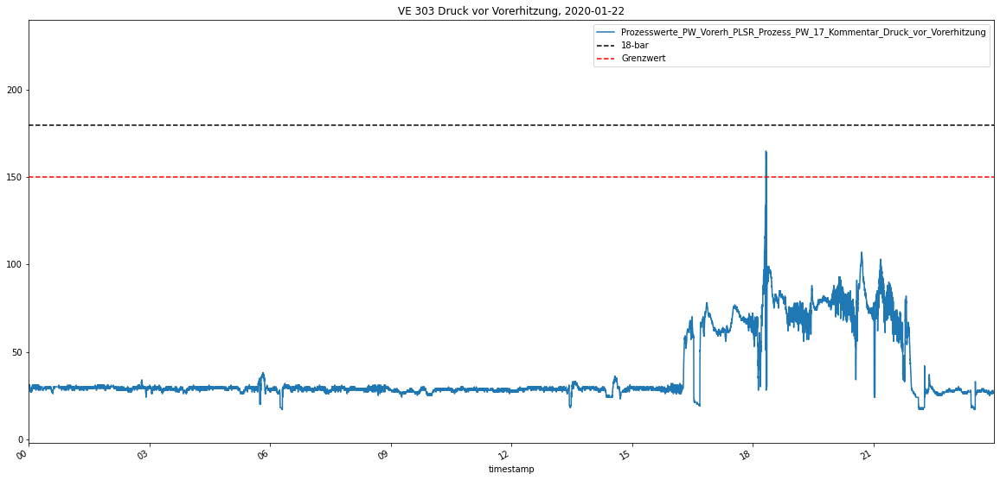

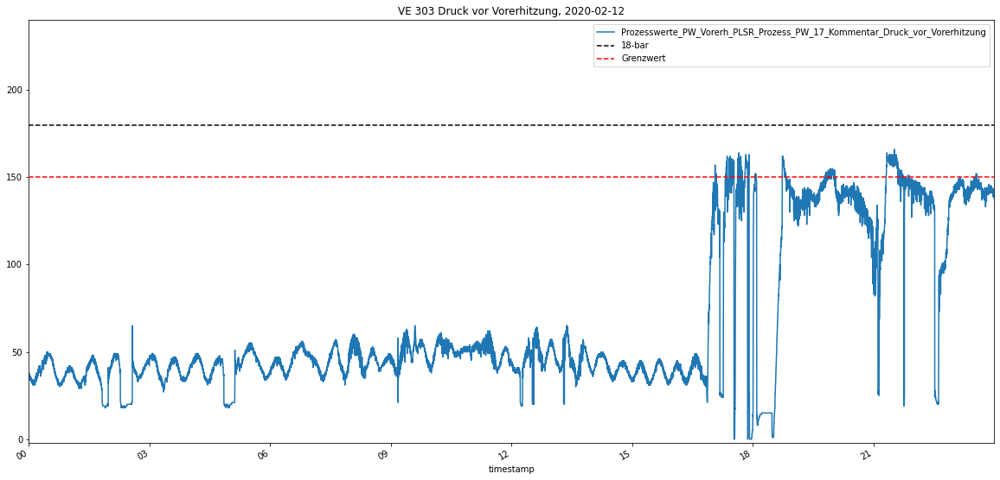

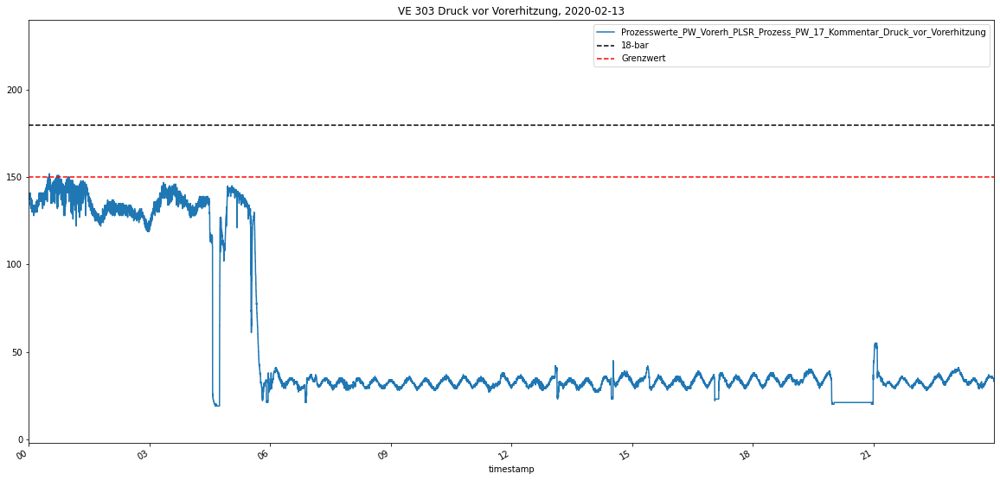

In [15]:
pdf = matplotlib.backends.backend_pdf.PdfPages("/data/jupyter/" + pdf_name + ".pdf")
for number in machines_of_interest:
    Machine = spark.read.parquet("/reif/01-data-corpus/" + number + "/VE/filled.parquet")
    days = Machine.withColumn("timestamp", F.date_trunc("day", "timestamp"))\
                               .groupBy("timestamp").agg(F.max(F.col("Prozesswerte_PW_Vorerh_PLSR_Prozess_PW_17_Kommentar_Druck_vor_Vorerhitzung")).alias("Druck"))\
                  .filter(F.col("Druck") >= 10*threshold)\
                  .select("timestamp")\
                  .orderBy("timestamp")\
                  .toPandas()["timestamp"].values
    for starting_timestamp in days:
        starting_timestamp = pd.to_datetime(starting_timestamp)
        end_timestamp = starting_timestamp + pd.Timedelta(23, "hour") + pd.Timedelta(59, "minute") + pd.Timedelta(59, "second")
        df = Machine.select("timestamp", "Prozesswerte_PW_Vorerh_PLSR_Prozess_PW_17_Kommentar_Druck_vor_Vorerhitzung").filter(F.col("timestamp") >= starting_timestamp).filter(F.col("timestamp") <= end_timestamp).toPandas()
        fig1, ax1 = plt.subplots(figsize=(20,10))
        
        ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
        fig1.autofmt_xdate()
        df.plot(x="timestamp", y= "Prozesswerte_PW_Vorerh_PLSR_Prozess_PW_17_Kommentar_Druck_vor_Vorerhitzung", ax = ax1)
        plt.title("VE " + number + " Druck vor Vorerhitzung, " + str(starting_timestamp)[0:10])
        plt.ylim(-2, 240)
        plt.xlim(starting_timestamp, end_timestamp)
        if threshold != 15:
            pd.DataFrame(data = [[starting_timestamp, 150], [end_timestamp, 150]], columns = ["timestamp", "15-bar"]).plot(x = "timestamp", y= "15-bar" , ax = ax1, color = "black", style = ["--"], zorder = 2)
        if threshold != 18: 
            pd.DataFrame(data = [[starting_timestamp, 180], [end_timestamp, 180]], columns = ["timestamp", "18-bar"]).plot(x = "timestamp", y= "18-bar", ax = ax1, color = "black", style = ["--"], zorder = 2)
        
        pd.DataFrame(data = [[starting_timestamp, threshold*10], [end_timestamp, threshold*10]], columns = ["timestamp", "Grenzwert"]).plot(x = "timestamp", y= "Grenzwert", ax = ax1, color = "red", style = ["--"], zorder = 3)

        plt.show()
        pdf.savefig(fig1)
        plt.close()
pdf.close()

______________

# Pressure over the year

We plot the pressure for every machine for every month. Since we can not really plot it down to the second and interested in high pressure anyway, we take the hourwise maximum.

In [31]:
machines_of_interest = ["300", "301", "302", "303"]
pdf_name = "Druck_monatsweise"

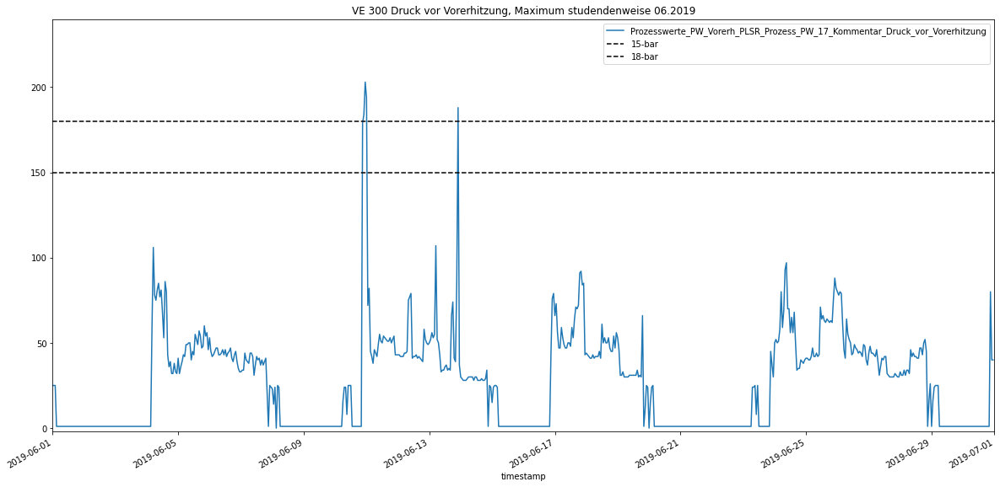

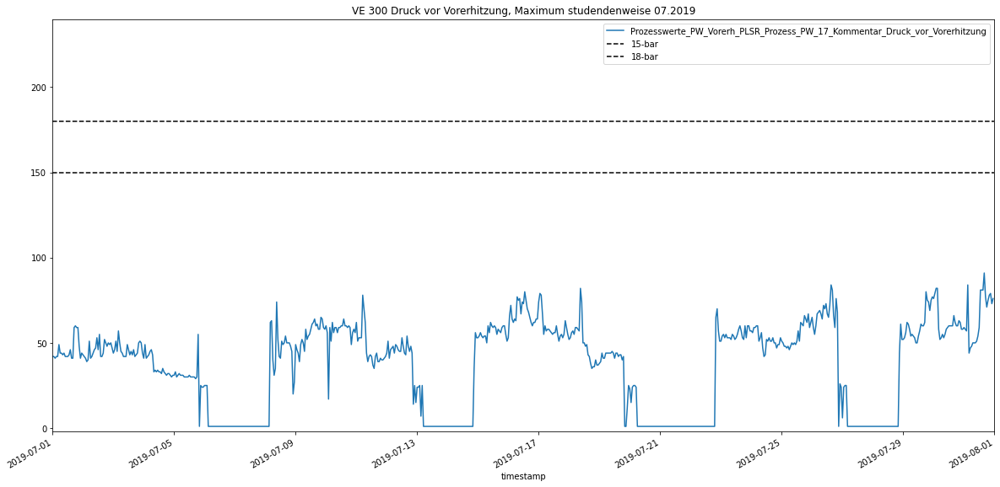

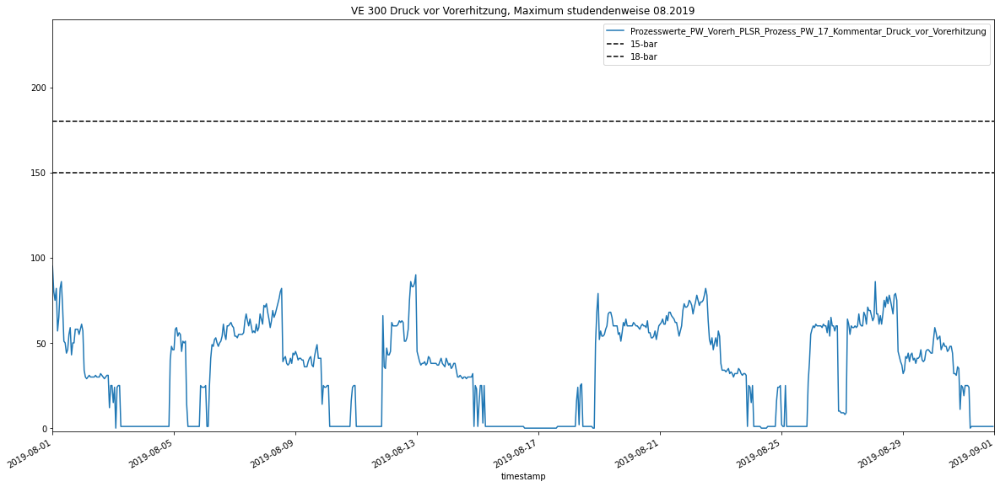

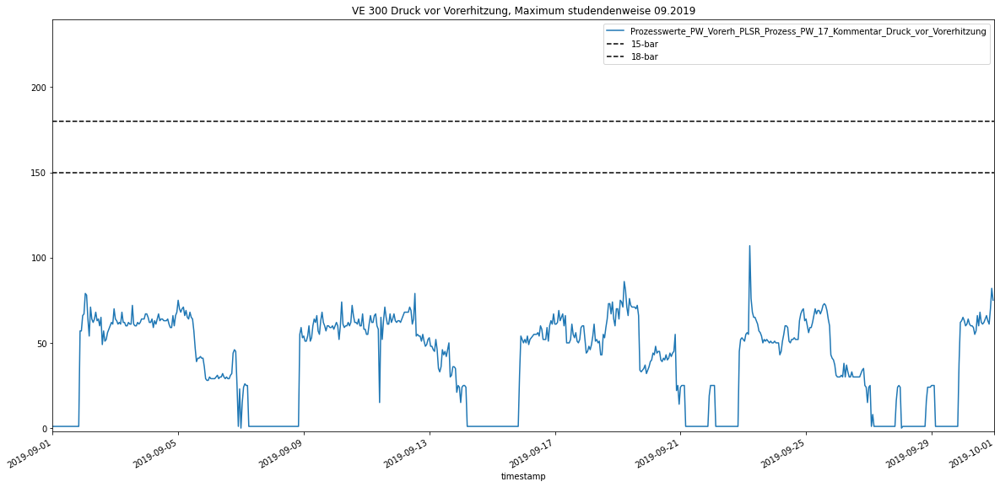

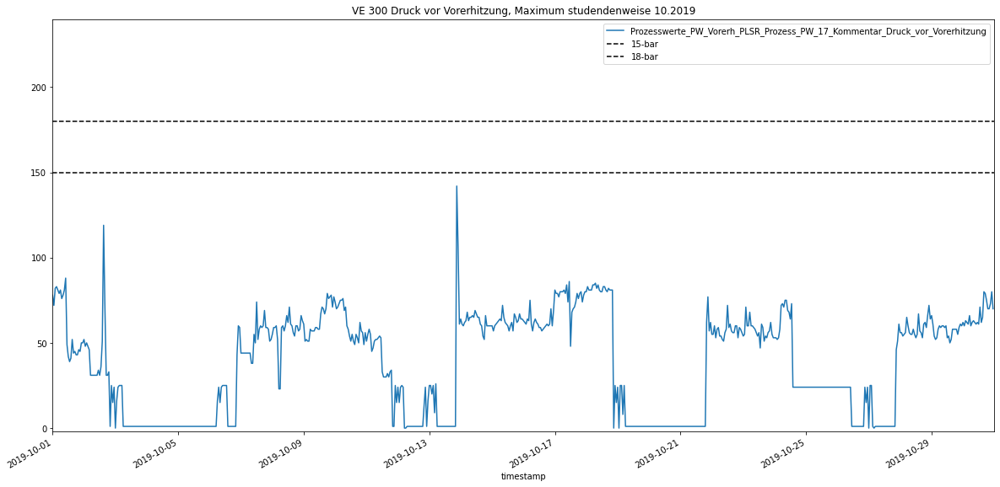

...

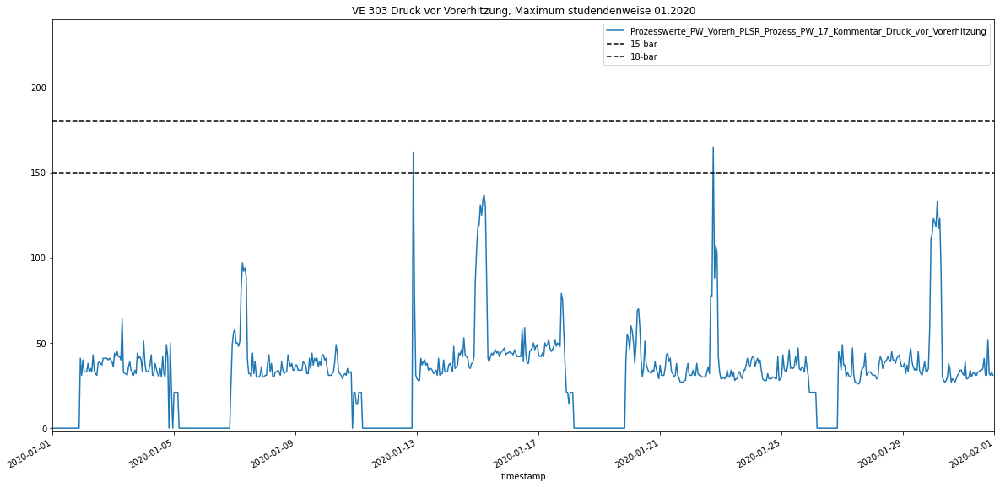

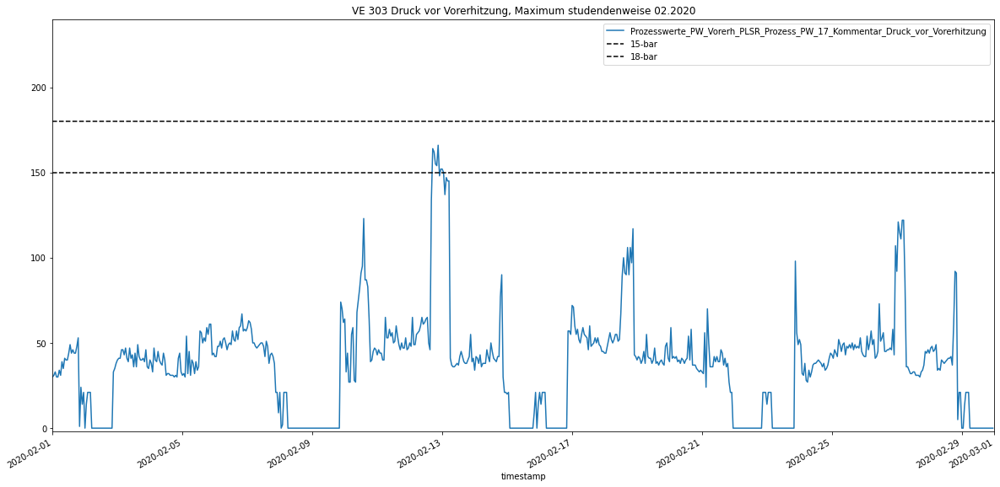

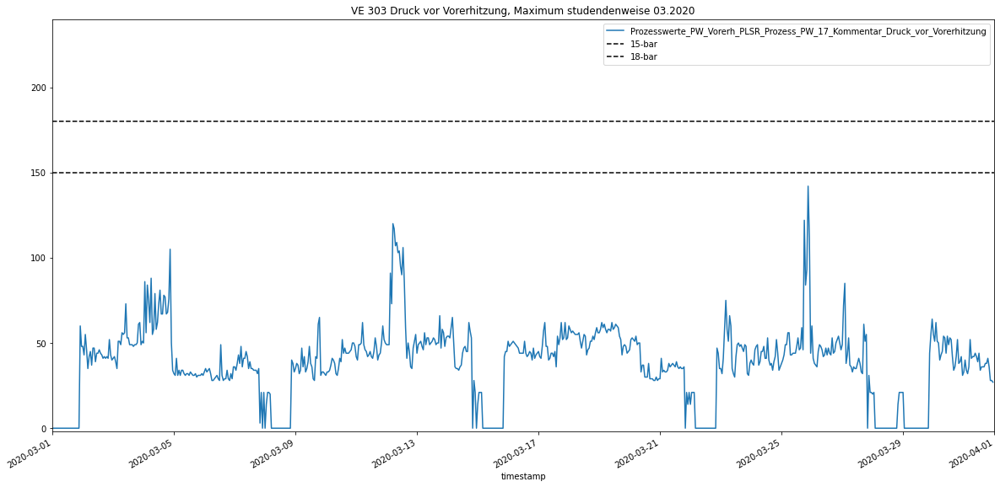

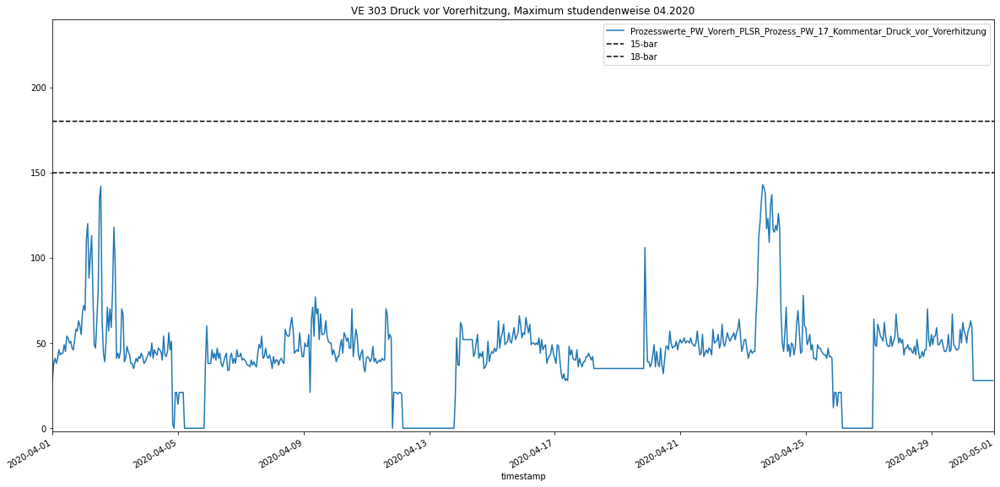

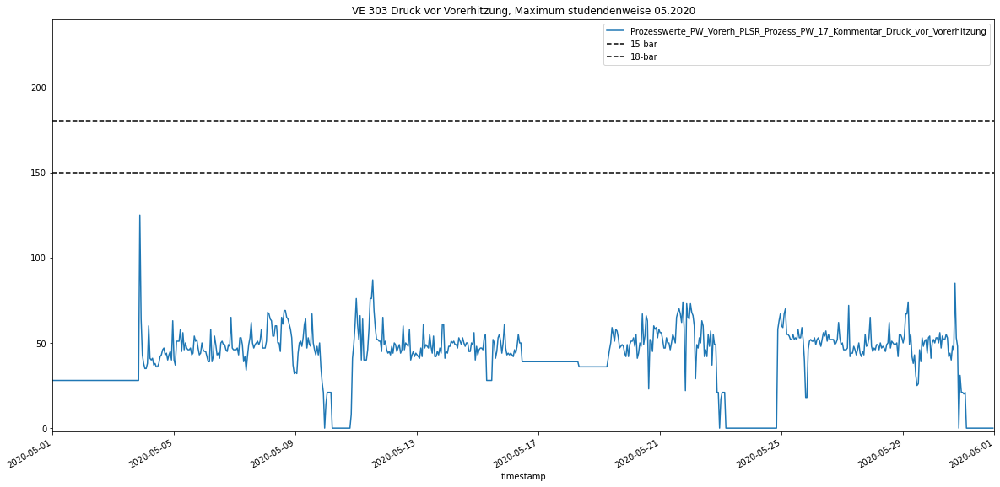

In [36]:
pdf = matplotlib.backends.backend_pdf.PdfPages("/data/jupyter/Druck_monatsweise.pdf")
for number in machines_of_interest:
    for year in [2019, 2020]: 
        if year == 2019: 
            months = range(6, 13)
        else: 
            months = range(1, 6)
        for month in months: 
            starting_timestamp = pd.to_datetime(str(year) + "-" + "{:02d}".format(month) + "-01 00:00:00")
            if month in [1, 3, 5, 7, 8, 19, 12]:
                end_timestamp = starting_timestamp + pd.Timedelta(31, "days")
            elif month == 2: 
                end_timestamp = starting_timestamp + pd.Timedelta(29, "days")
            else: 
                end_timestamp = starting_timestamp + pd.Timedelta(30, "days")
            fig1, ax1 = plt.subplots(figsize=(20,10))
            spark_df = spark.read.parquet("/reif/01-data-corpus/" + number + "/VE/filled.parquet")
            pd_df = spark_df.withColumn("timestamp", F.date_trunc("hour", "timestamp"))\
                            .groupBy("timestamp").agg(F.max("Prozesswerte_PW_Vorerh_PLSR_Prozess_PW_17_Kommentar_Druck_vor_Vorerhitzung")\
                                                      .alias("Prozesswerte_PW_Vorerh_PLSR_Prozess_PW_17_Kommentar_Druck_vor_Vorerhitzung"))\
                            .filter(F.col("timestamp") >= starting_timestamp)\
                            .filter(F.col("timestamp") < end_timestamp)\
                            .toPandas()
            pd_df.plot(x = "timestamp", y = "Prozesswerte_PW_Vorerh_PLSR_Prozess_PW_17_Kommentar_Druck_vor_Vorerhitzung", ax = ax1)
            plt.ylim(-2, 240)
            plt.xlim(starting_timestamp, end_timestamp)
            
            pd.DataFrame(data = [[starting_timestamp, 150], [end_timestamp, 150]], columns = ["timestamp", "15-bar"]).plot(x = "timestamp", y= "15-bar" , ax = ax1, color = "black", style = ["--"], zorder = 2) 
            pd.DataFrame(data = [[starting_timestamp, 180], [end_timestamp, 180]], columns = ["timestamp", "18-bar"]).plot(x = "timestamp", y= "18-bar", ax = ax1, color = "black", style = ["--"], zorder = 2)
            
            plt.title("VE " + number + " Druck vor Vorerhitzung, Maximum studendenweise " + "{:02d}".format(starting_timestamp.month) + "." + str(starting_timestamp.year))
            plt.show()
            pdf.savefig(fig1)
            plt.close
pdf.close()

___________________

# Large changes in pressure

In [46]:
window_size = 10 #Number of seconds in which the pressure change can occur
spike_size = 5 #How many bar the pressure has to change
pdf_name = "Spruenge-" + str(spike_size) + "-bar-" + str(window_size) + "-sekunden"
machines_of_interest = ["300", "301", "302", "303"]

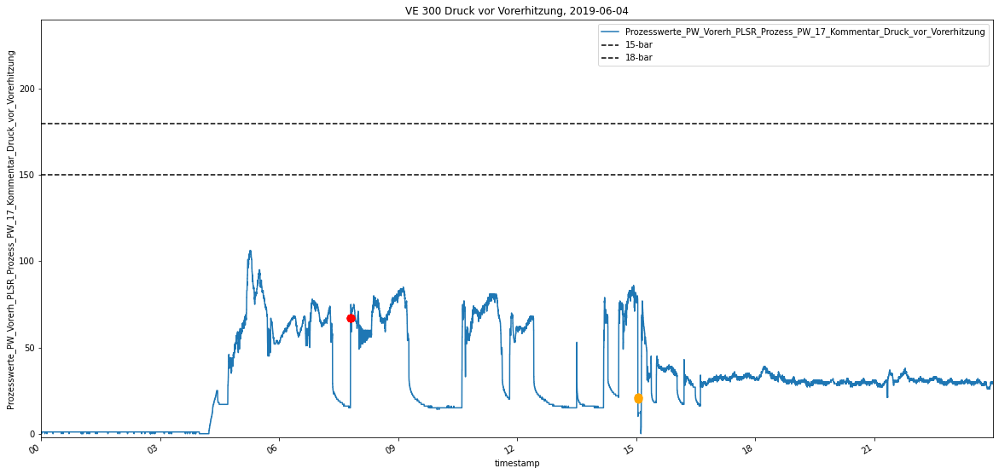

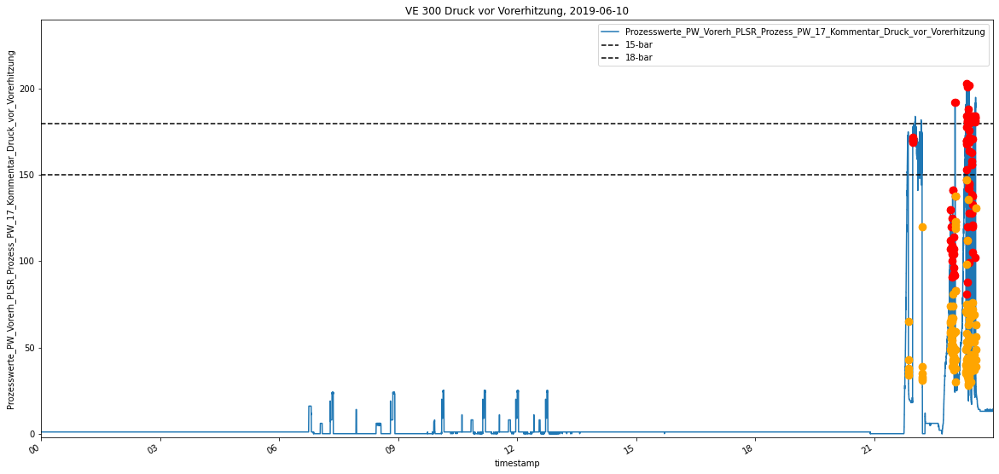

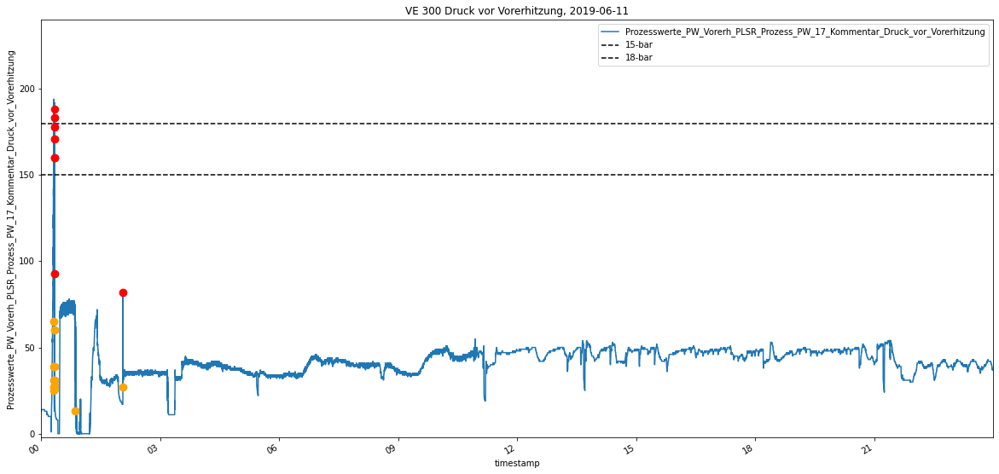

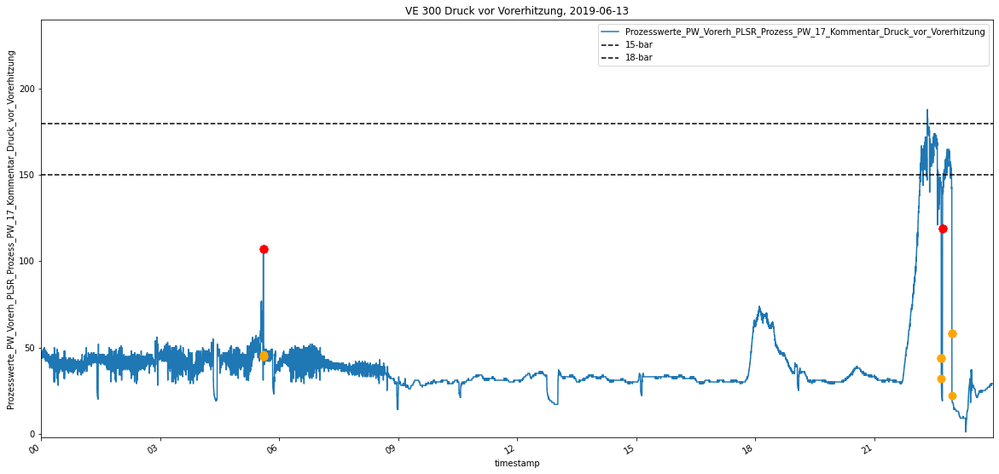

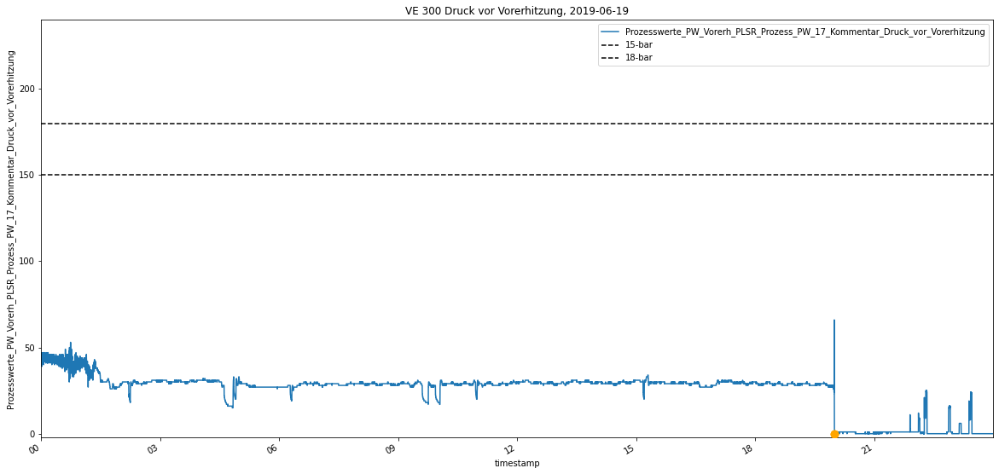

...

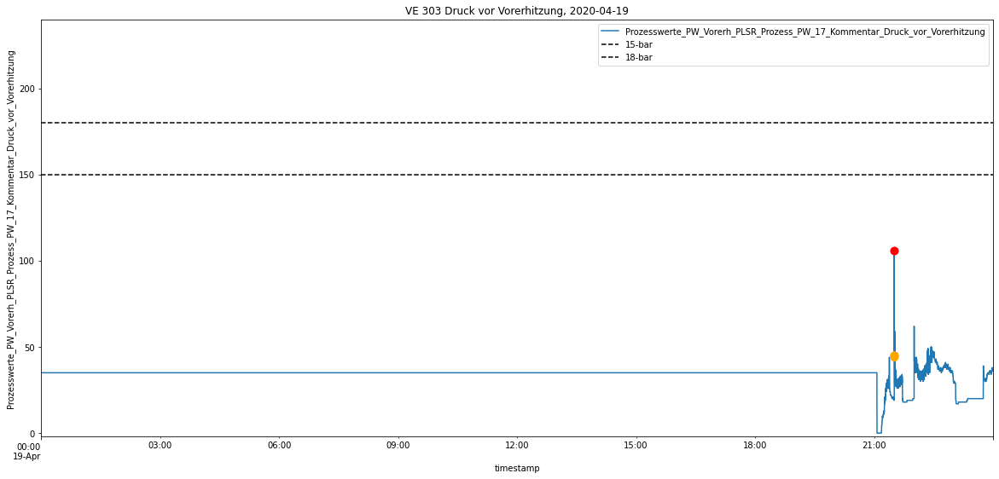

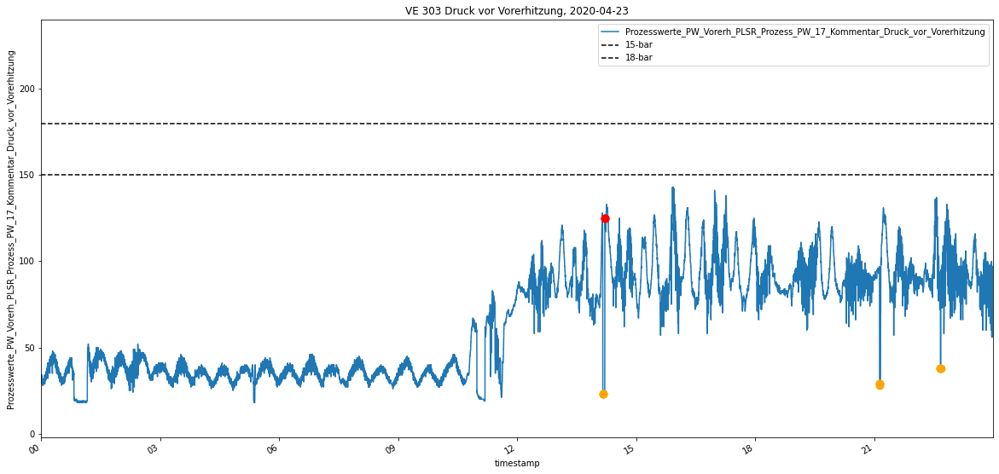

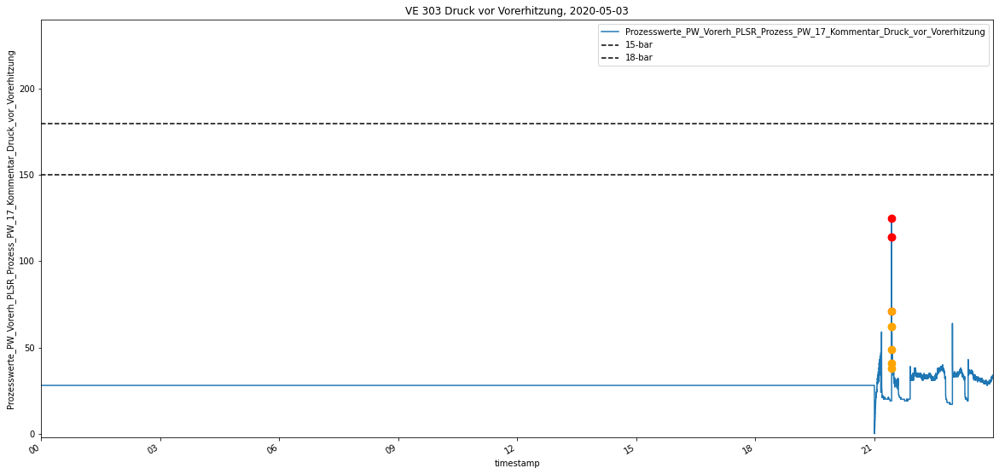

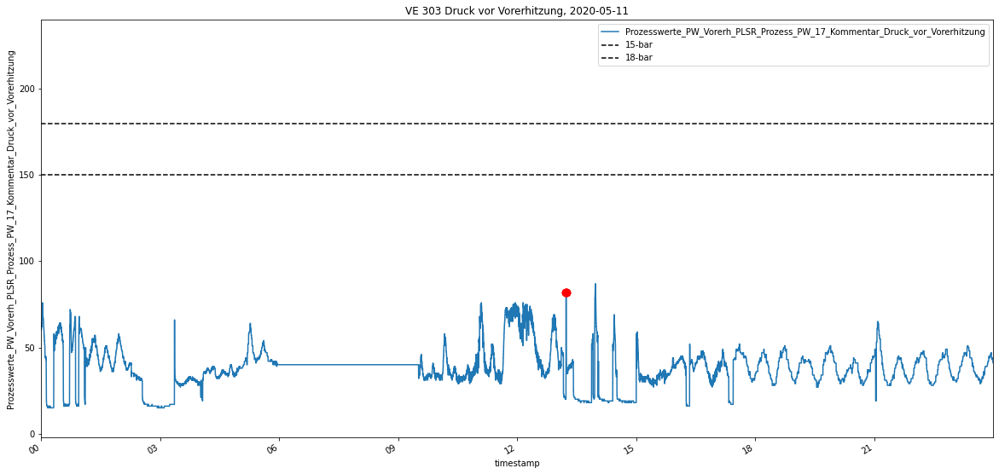

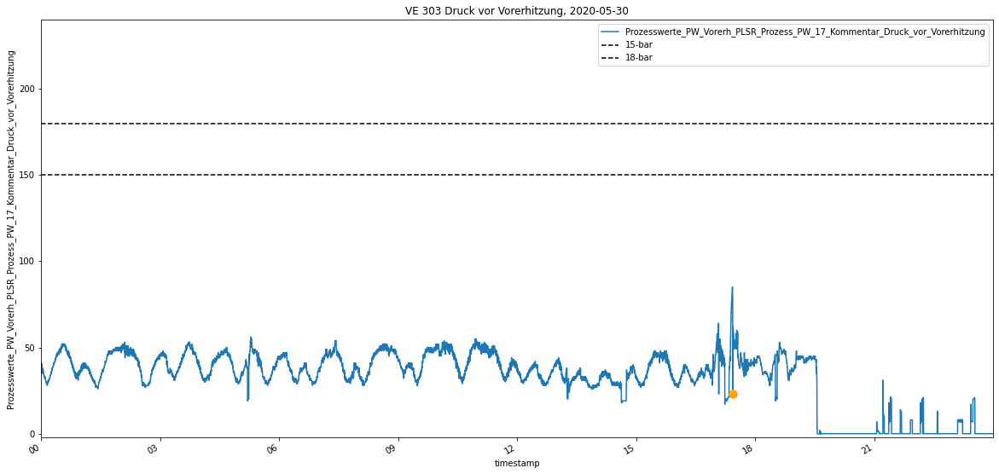

In [47]:
#If you do not want to save a pdf, simply comment out all the lines that start with pdf (3 of them) 
#if you do not want to be shown the plots (just saved in the pdf), comment out out the "plt.show()"


pdf = matplotlib.backends.backend_pdf.PdfPages("/data/jupyter/" + pdf_name + ".pdf")
my_window = Window.partitionBy(F.date_trunc("month", F.col("timestamp"))).orderBy(F.col("timestamp").cast("long")).rangeBetween(-window_size,0)

for number in machines_of_interest:
    Machine = spark.read.parquet("/reif/01-data-corpus/" + number + "/VE/filled.parquet")
    column = "Prozesswerte_PW_Vorerh_PLSR_Prozess_PW_17_Kommentar_Druck_vor_Vorerhitzung"
    spike = Machine.select("timestamp", column)\
                    .withColumn("prev_min", F.min(column).over(my_window))\
                    .withColumn("prev_max", F.max(column).over(my_window))\
                    .filter( (F.col(column) - F.col("prev_min") > 10*spike_size) | (F.col("prev_max") - F.col(column) > 10*spike_size)).cache()
    upspike_df = spike.filter(F.col(column) - F.col("prev_min") > 10*spike_size).toPandas()
    downspike_df = spike.filter(F.col("prev_max") - F.col(column) > 10*spike_size).toPandas()
    days = spike.withColumn("timestamp", F.date_trunc("day", "timestamp"))\
                  .select("timestamp")\
                  .distinct()\
                  .orderBy("timestamp")\
                  .toPandas()["timestamp"].values
    
    for starting_timestamp in days:
        starting_timestamp = pd.to_datetime(starting_timestamp)
        end_timestamp = starting_timestamp + pd.Timedelta(23, "hour") + pd.Timedelta(59, "minute") + pd.Timedelta(59, "second")
        df = Machine.select("timestamp", column).filter(F.col("timestamp") >= starting_timestamp).filter(F.col("timestamp") <= end_timestamp).toPandas()
        
        
        fig1, ax1 = plt.subplots(figsize=(20,10))
        ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
        fig1.autofmt_xdate()
        df.plot(x="timestamp", y= column, ax = ax1, zorder = 1)
        upspike_df[(upspike_df["timestamp"] > starting_timestamp) & (upspike_df["timestamp"] < end_timestamp)].plot(x="timestamp", y= column, ax = ax1, kind = "scatter", color = "red", linewidth = 5, zorder = 3) 
        downspike_df[(downspike_df["timestamp"] > starting_timestamp) & (downspike_df["timestamp"] < end_timestamp)].plot(x="timestamp", y= column, ax = ax1, kind = "scatter", color = "orange", linewidth = 5, zorder = 3) 
        pd.DataFrame(data = [[starting_timestamp, 150], [end_timestamp, 150]], columns = ["timestamp", "15-bar"]).plot(x = "timestamp", y= "15-bar" , ax = ax1, color = "black", style = ["--"], zorder = 2)
        pd.DataFrame(data = [[starting_timestamp, 180], [end_timestamp, 180]], columns = ["timestamp", "18-bar"]).plot(x = "timestamp", y= "18-bar", ax = ax1, color = "black", style = ["--"], zorder = 2)
        
        plt.title("VE " + number + " Druck vor Vorerhitzung, " + str(starting_timestamp)[0:10])
        plt.ylim(-2, 240)
        plt.xlim(starting_timestamp, end_timestamp)
        plt.show()
        pdf.savefig(fig1)
        plt.close()
pdf.close()

____________________________